# NYC Airbnb - Exploratory Data Analysis

In this project, exploratory data analysis is performed on data collected by Airbnb in New York City. Patterns and trends seen in the data could then be used to make insights.

The original dataset for this project comes from the [kaggle](https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data) website. The NYC Airbnb data describes listing activity and metrics for 2019, and contains 48,895 entries and 16 attributes from various neighbourhoods throughout New York City. 

The following preprocessing step has been made to the dataset:

- For this particular analysis, attributes 'name', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'minimum_nights', 'number_of_reviews', 'availability_365' are essential. The remaining **non-relevant attributes have been excluded**.

We begin by reading in the data:

In [1]:
# Install Packages, if necessary

#install.packages("dplyr")
#install.packages("gsubfn")
#install.packages("ggplot2")
#install.packages("data.table")
#install.packages("patchwork")
#install.packages("htmltools")
#install.packages("leaflet")
#install.packages("ctv")
#install.packages("tm")
#install.packages("SnowballC")
#install.packages("wordcloud")
#install.packages("RColorBrewer")

In [2]:
# Load libraries

library(dplyr)
library(gsubfn)
library(ggplot2)
library(data.table)
library(htmltools)
library(leaflet)
library(ctv)
library(tm)
library(SnowballC)
library(wordcloud)
library(RColorBrewer)

Warning message:
"package 'dplyr' was built under R version 3.6.3"
Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union

Warning message:
"package 'gsubfn' was built under R version 3.6.3"Loading required package: proto
Warning message:
"package 'proto' was built under R version 3.6.3"Warning message:
"package 'ggplot2' was built under R version 3.6.3"Warning message:
"package 'data.table' was built under R version 3.6.3"
Attaching package: 'data.table'

The following objects are masked from 'package:dplyr':

    between, first, last

Warning message:
"package 'leaflet' was built under R version 3.6.3"Warning message:
"package 'ctv' was built under R version 3.6.3"Warning message:
"package 'tm' was built under R version 3.6.3"Loading required package: NLP

Attaching package: 'NLP'

The following object is masked from 'package:ggplot2':

    anno

In [3]:
# Plot size settings

options(repr.plot.width=8, repr.plot.height=5)

In [4]:
# Load the Airbnb dataset
setwd("C:/Users/jasmi/Desktop/Programming/JupyterntbkData")
data <- read.csv("Airbnb_NYC_2019.csv", header = TRUE)

# Confirm
print(paste("NYC Airbnb dataset has", nrow(data), "listings with",
            ncol(data), "attributes each."))

[1] "NYC Airbnb dataset has 48895 listings with 10 attributes each."


___

## Data Exploration

In this section, we perform our investigation of the Airbnb listing data. We have **three primary tasks** to accomplish:

- 1) Determine how price varies based on attributes
- 2) See how number of reviews varies based on attributes
- 3) Find the most commonly used words in listing titles

### Data Summary

We'll start by looking at the summary statistics about the listing attributes.

*Note: Frequency is listed instead of summary stats for string variables.*

In [5]:
summary(data)

                               name          neighbourhood_group
 Hillside Hotel                  :   18   Bronx        : 1091   
 Home away from home             :   17   Brooklyn     :20104   
                                 :   16   Manhattan    :21661   
 New york Multi-unit building    :   16   Queens       : 5666   
 Brooklyn Apartment              :   12   Staten Island:  373   
 Loft Suite @ The Box House Hotel:   11                         
 (Other)                         :48805                         
            neighbourhood      latitude       longitude     
 Williamsburg      : 3920   Min.   :40.50   Min.   :-74.24  
 Bedford-Stuyvesant: 3714   1st Qu.:40.69   1st Qu.:-73.98  
 Harlem            : 2658   Median :40.72   Median :-73.96  
 Bushwick          : 2465   Mean   :40.73   Mean   :-73.95  
 Upper West Side   : 1971   3rd Qu.:40.76   3rd Qu.:-73.94  
 Hell's Kitchen    : 1958   Max.   :40.91   Max.   :-73.71  
 (Other)           :32209                            



### The Attributes

To become better aquainted with the data, we need to review what the listing features are:

- 'name' is the title/heading associated with the listing
- 'neighbourhood_group' is one of the 5 boroughs of NYC that the listing is located in 
- 'neighbourhood' is the NYC neighborhood the listing is located in
- 'latitude' and 'longitude' refer to the coordinates of the listing property
- 'room_type' is the the type of room the listing refers to
- 'price' is the price (dollars) per night to stay at the listing property
- 'minimum_nights' is the minimum number of nights a guest must reserve a property for
- 'number_of_reviews' is the total number of reviews for each listing as of 2019
- 'availability_365' is the the total number of days in a year that a listing is available

Something to take note of is that there are 0 values in `'availability_365'`, which correspond to listings hosts have made currently unavailable. We will keep these listings for now.

We also notice that some `'price'` values are not whole numbers, so our next step is to change the price so that it is rounded to the nearest dollar. We can also change the `'neighbourhood_group'` name for 'Bronx' to 'the Bronx':

In [7]:
data$price <- round(data$price)

data$neighbourhood_group <- gsub('Bronx', 'the Bronx', data$neighbourhood_group)
data$neighbourhood_group <- as.factor(data$neighbourhood_group)   

___

### Task 1) Listing Price Analysis


Our first goal is to see how prices vary depending on the listing attributes.

#### Let's first make a histogram of `'price'` to see how it is distributed:

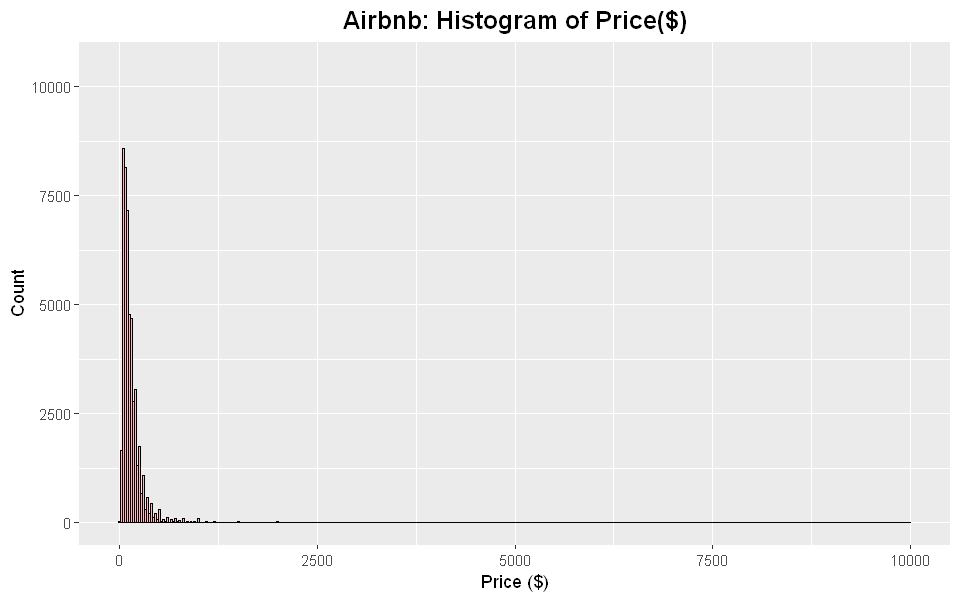

In [8]:
ggplot(data, aes(x=price)) + geom_histogram(binwidth = 25, color="black", fill="lightpink") + 
  coord_cartesian(ylim=c(0,10500)) + 
  labs(x = "Price ($)", y = "Count", title = "Airbnb: Histogram of Price($)") +
  theme(plot.title = element_text(face = "bold", size = (15), hjust = 0.5))

Recall that price has a median value of \\$106, which is confirmed in the histogram. There appear to be some listings with much higher prices, some of which are the maximum price of \\$10,000. These high prices make the distribution skewed to the right.

#### We can plot `'price'` versus the other attributes to help make any trends apparent:

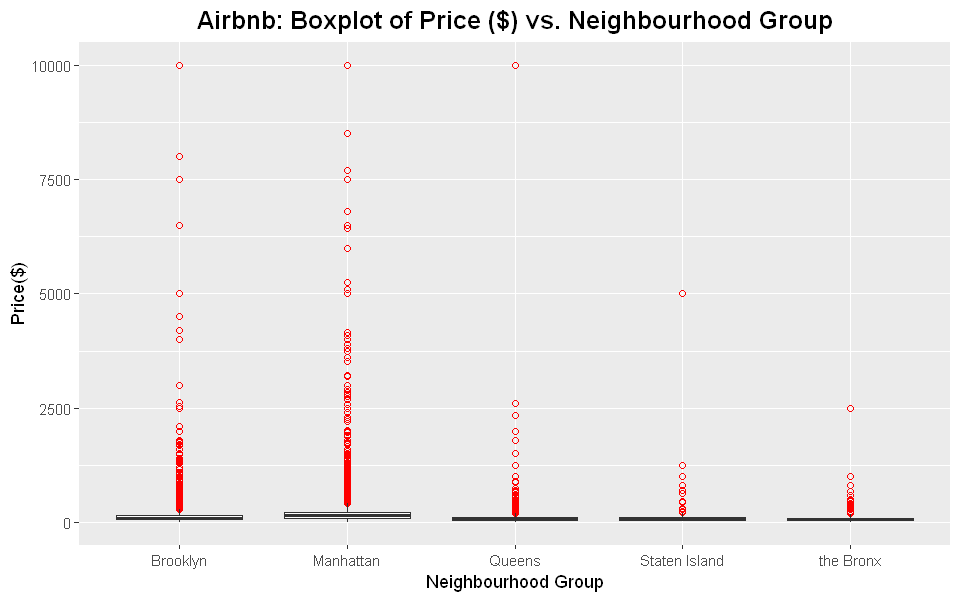

In [10]:
ggplot(data, aes(x=neighbourhood_group, y=price)) + geom_boxplot(outlier.colour = "red", outlier.shape = 1) +
  labs(x = "Neighbourhood Group", y = "Price($)", title = "Airbnb: Boxplot of Price ($) vs. Neighbourhood Group") +
  theme(plot.title = element_text(face = "bold", size = (15), hjust = 0.5))

In [11]:
# Median prices for each neighbourhood group:
neighb_groups <- levels(data$neighbourhood_group)
for (i in seq(1,length(neighb_groups),1)) {
  print(paste("Median price ($) for", neighb_groups[i], ":", round(median(data$price[data$neighbourhood_group == neighb_groups[i]]))))
}

[1] "Median price ($) for Brooklyn : 90"
[1] "Median price ($) for Manhattan : 150"
[1] "Median price ($) for Queens : 75"
[1] "Median price ($) for Staten Island : 75"
[1] "Median price ($) for the Bronx : 65"


- The neighbourhood group (a.k.a. borough) with the **most expensive median listing price is Manhattan**, followed by Brooklyn, Queens and Staten Island, and Bronx

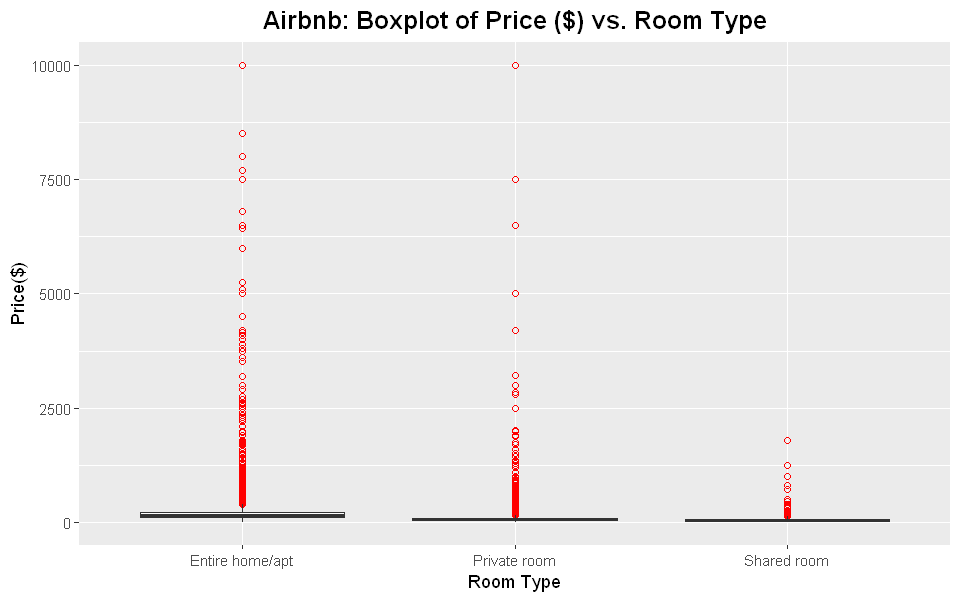

In [12]:
ggplot(data, aes(x=room_type, y=price)) + geom_boxplot(outlier.colour = "red", outlier.shape = 1) +
  labs(x = "Room Type", y = "Price($)", title = "Airbnb: Boxplot of Price ($) vs. Room Type") +
  theme(plot.title = element_text(face = "bold", size = (15), hjust = 0.5))

In [13]:
# Median prices for each room type:
rooms <- levels(data$room_type)
for (i in seq(1,length(rooms),1)) {
  print(paste("Median price ($) for", rooms[i], ":", round(median(data$price[data$room_type == rooms[i]]))))
}

[1] "Median price ($) for Entire home/apt : 160"
[1] "Median price ($) for Private room : 70"
[1] "Median price ($) for Shared room : 45"


- The **most expensive room type is 'Entire home/apt'** followed by 'Private room' then 'Shared room', as expected.

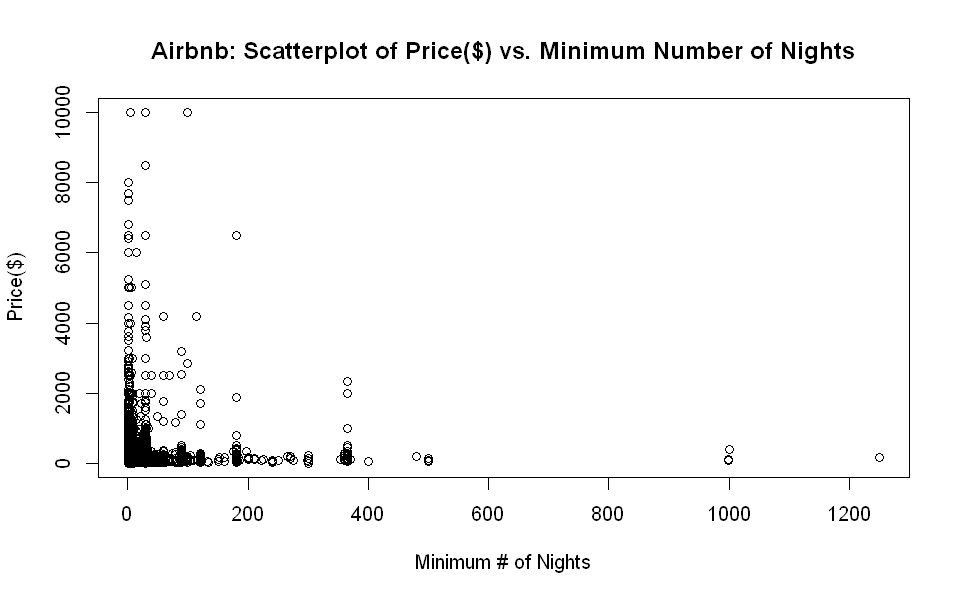

In [14]:
plot(data$minimum_nights, data$price, xlab="Minimum # of Nights", ylab="Price($)",
     main="Airbnb: Scatterplot of Price($) vs. Minimum Number of Nights")

- It appears that listings that require a **lower minimum number of nights have higher prices and a wider range in price** than those that require about 180 days (6 months), 365 days (12 months), or 1000+ days (~ 2 or 3 years).

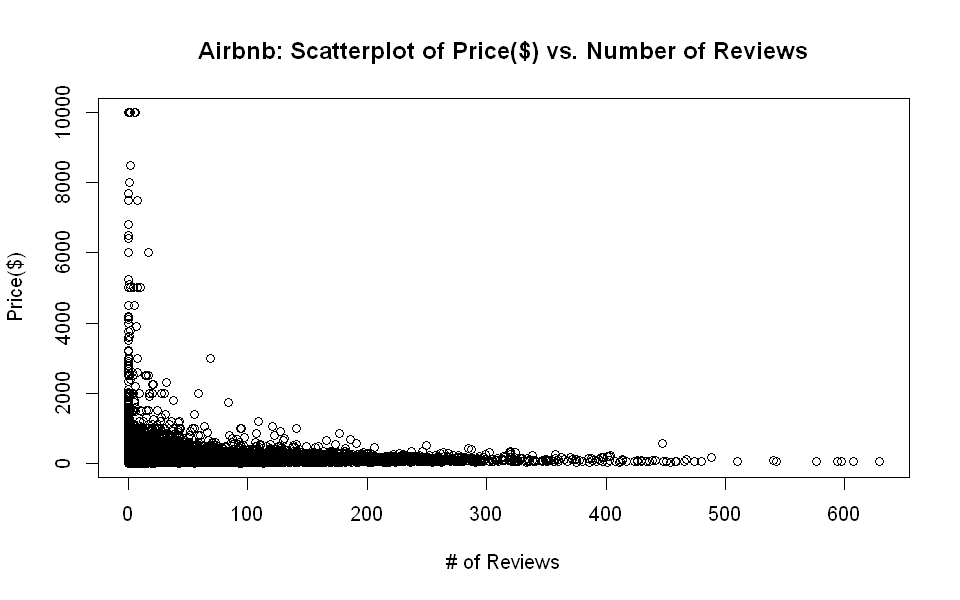

In [15]:
plot(data$number_of_reviews, data$price, xlab="# of Reviews", ylab="Price($)",
     main="Airbnb: Scatterplot of Price($) vs. Number of Reviews")

- The majority of listings had less than 100 reviews. Listings with **lower prices tend to have more reviews**. 

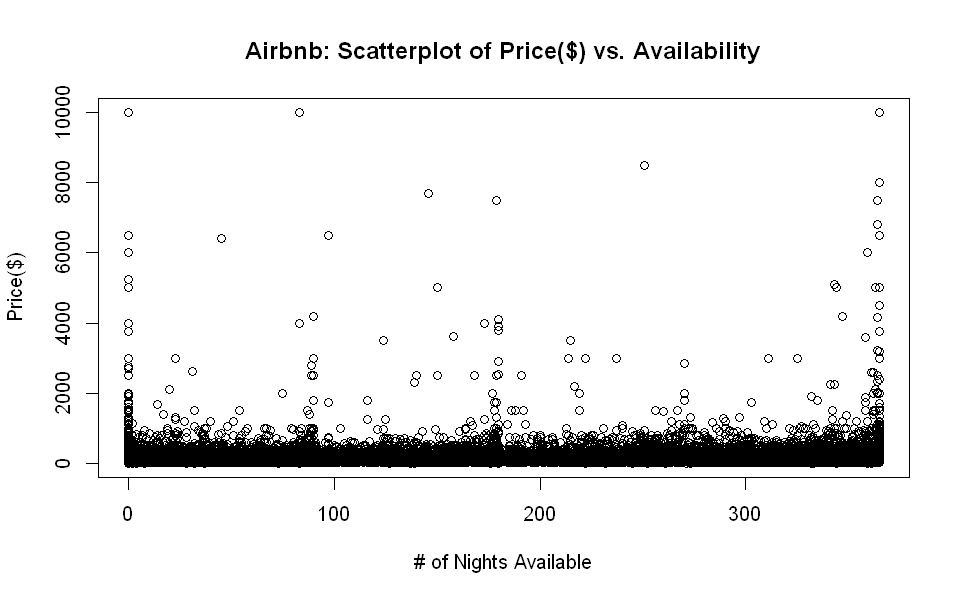

In [16]:
plot(data$availability_365, data$price, xlab="# of Nights Available", ylab="Price($)",
     main="Airbnb: Scatterplot of Price($) vs. Availability")

- First, note that there appear to be expensive listings with 0 nights available. Recall that these refer to listings that are currently unavailable, so disregard these for now. Second, there appear to be many **higher priced listings when the property is available for almost the entire year (~365 days)**. Third, there appear to be spikes in price when a property is available for about 90 days (3 months), 180 days (6 months), and 270 days (9 months).

**We can determine the median listing `'price'` for each `'neighbourhood_group'` and `'room_type'`:**

In [17]:
# Median prices for each room type in the 5 neighbourhood groups:
for (i in seq(1,length(neighb_groups),1)) {
    neighb_df <- data[data$neighbourhood_group == neighb_groups[i],]
    for (j in seq(1,length(rooms),1)) {
        print(paste("Median price ($) for", rooms[j], "in", neighb_groups[i], ":", 
                    round(median(neighb_df$price[neighb_df$room_type == rooms[j]]))))
        }
    print("-------------------------------")
}

[1] "Median price ($) for Entire home/apt in Brooklyn : 145"
[1] "Median price ($) for Private room in Brooklyn : 65"
[1] "Median price ($) for Shared room in Brooklyn : 36"
[1] "-------------------------------"
[1] "Median price ($) for Entire home/apt in Manhattan : 191"
[1] "Median price ($) for Private room in Manhattan : 90"
[1] "Median price ($) for Shared room in Manhattan : 69"
[1] "-------------------------------"
[1] "Median price ($) for Entire home/apt in Queens : 120"
[1] "Median price ($) for Private room in Queens : 60"
[1] "Median price ($) for Shared room in Queens : 37"
[1] "-------------------------------"
[1] "Median price ($) for Entire home/apt in Staten Island : 100"
[1] "Median price ($) for Private room in Staten Island : 50"
[1] "Median price ($) for Shared room in Staten Island : 30"
[1] "-------------------------------"
[1] "Median price ($) for Entire home/apt in the Bronx : 100"
[1] "Median price ($) for Private room in the Bronx : 54"
[1] "Median price ($

- There is a **difference in price when the specific `'neighbourhood_group'` and `'room_type'` are taken into account**
- For example, recall that the median price for Manhattan was \\$150 and the median price for an entire home/apt was \\$160. We now see that the median price for an entire home/apt in Manhattan is \\$191

**We can find the top three most frequent `'neighbourhood'` in each `'neighbourhood_group'` and determine their median listing `'price'`, for each `'room_type'`:**

In [18]:
# Split data based on neibhourhood group
bronx_df <- data[data$neighbourhood_group == "Bronx",]
brook_df <- data[data$neighbourhood_group == "Brooklyn",]
manhat_df <- data[data$neighbourhood_group == "Manhattan",]
queens_df <- data[data$neighbourhood_group == "Queens",]
staten_df <- data[data$neighbourhood_group == "Staten Island",]

# Find the top three most frequent neighbourhoods for each neighbourhood group
bronx_top_three_neighb <- sort(table(bronx_df[, "neighbourhood"]), decreasing = TRUE)[1:3] # Counts of three most frequent neighbourhoods
bronx_top <- c('Kingsbridge', 'Fordham', 'Longwood')

brook_top_three_neighb <- sort(table(brook_df[, "neighbourhood"]), decreasing = TRUE)[1:3]
brook_top <- c('Williamsburg', 'Bedford-Stuyvesant', 'Bushwick')

manhat_top_three_neighb <- sort(table(manhat_df[, "neighbourhood"]), decreasing = TRUE)[1:3]
manhat_top <- c("Harlem", "Upper West Side", "Hell's Kitchen")

queens_top_three_neighb <- sort(table(queens_df[, "neighbourhood"]), decreasing = TRUE)[1:3] 
queens_top <- c('Astoria', 'Long Island City', 'Flushing')

staten_top_three_neighb <- sort(table(staten_df[, "neighbourhood"]), decreasing = TRUE)[1:3] 
staten_top <- c('St. George', 'Tompkinsville', 'Stapleton')

# Create a vector with the top three most frequent neighbourhoods for each neighbourhood group
top_three <- c(bronx_top, brook_top, manhat_top, queens_top, staten_top)

# Get Median prices($) for each room type for top five neighbourhoods in each neighbourhood group with the most frequent listings
i <- 1
j <- 1

for (i in seq(1, length(top_three), 1)) {
    three_sample <- data[data$neighbourhood == top_three[i],]
    neighb_group_name <- data$neighbourhood_group[data$neighbourhood == top_three[i]]
    for (j in seq(1, length(rooms), 1)) {
        neighbourhood <- top_three[i]
        print(paste("Median price ($) for", rooms[j], "in", neighbourhood, "in", neighb_group_name[1], ":", 
                    round(median(three_sample$price[three_sample$room_type == rooms[j]]))))
    }
    print("-------------------------------------------------")
}


[1] "Median price ($) for Entire home/apt in Kingsbridge in the Bronx : 100"
[1] "Median price ($) for Private room in Kingsbridge in the Bronx : 65"
[1] "Median price ($) for Shared room in Kingsbridge in the Bronx : 35"
[1] "-------------------------------------------------"
[1] "Median price ($) for Entire home/apt in Fordham in the Bronx : 100"
[1] "Median price ($) for Private room in Fordham in the Bronx : 55"
[1] "Median price ($) for Shared room in Fordham in the Bronx : 55"
[1] "-------------------------------------------------"
[1] "Median price ($) for Entire home/apt in Longwood in the Bronx : 95"
[1] "Median price ($) for Private room in Longwood in the Bronx : 65"
[1] "Median price ($) for Shared room in Longwood in the Bronx : 85"
[1] "-------------------------------------------------"
[1] "Median price ($) for Entire home/apt in Williamsburg in Brooklyn : 175"
[1] "Median price ($) for Private room in Williamsburg in Brooklyn : 75"
[1] "Median price ($) for Shared room 

- Notice again that there is a **difference in price when we take into account the top three most frequent `'neighbourhood'`, `'neighbourhood_group'`, and '`room_type'`** 
- Note: the most frequent neighbourhoods may not have shared rooms, which is indicated with NA, but the neighbourhood group may have shared rooms.

**We can mark and label all the listings on a map of New York City**

We will *add a new column* to the dataframe consisting of median prices:

In [19]:
# First, make a median prices matrix:
median_prices <- matrix(rep(NA), nrow=length(unique(data$room_type)), 
                       ncol=length(unique(data$neighbourhood_group)))

# Second, fill matrix with respective median prices
for (i in 1:length(unique(data$room_type))){
  for (j in 1:length(unique(data$neighbourhood_group))){
    temp_subset <- filter(data, room_type == sort(unique(data$room_type))[i],
                          neighbourhood_group == sort(unique(data$neighbourhood_group))[j])
    median_prices[i,j] <- round(median(temp_subset$price))
  }
} 

# Third, make two new columns where room and type and neighbourhood group are factors
data$room_type_num <- as.numeric(factor(data$room_type))
data$neighbourhood_group_num <- as.numeric(factor(data$neighbourhood_group))

# Finally, creat a median price column and fill it with the appropriate values from the median_prices matrix
for (i in 1:nrow(data)){
  data$median_price[i] <- median_prices[data$room_type_num[i], data$neighbourhood_group_num[i]]
}

We can now make a dataframe with select attraction names and their coordinates:

In [20]:
## Make attractions dataframe

attractions_df <- data.frame(borough=c("Manhattan", "Manhattan", "Bronx", "Bronx", "Brooklyn", "Queens", "Staten Island"),
  place=c("Central Park", "Times Square", "Bronx Zoo", "Yankee Stadium", "Coney Island", "Citi Field", "Historic Richmond Town"),
  lat=c(40.785091, 40.758896, 40.852905, 40.829659, 40.57788, 40.75673, 40.57129),
  lon=c(-73.968285, -73.985130, -73.872971, -73.926186, -73.99403, -73.84597, -74.14581))
attractions_df

borough,place,lat,lon
Manhattan,Central Park,40.78509,-73.96828
Manhattan,Times Square,40.75890,-73.98513
Bronx,Bronx Zoo,40.85290,-73.87297
Bronx,Yankee Stadium,40.82966,-73.92619
Brooklyn,Coney Island,40.57788,-73.99403
Queens,Citi Field,40.75673,-73.84597
Staten Island,Historic Richmond Town,40.57129,-74.14581


In [21]:
# Map of all listings and some attractions in NYC:

# Create labels for map
data$labs <- lapply(seq(nrow(data)), function(i) {
  paste("<p>", data[i,"name"],"<br/>",
        "Location:", data[i,"neighbourhood_group"], "<br/>",
        "Type:", data[i,"room_type"], "<br/>",
        "Price: $", data[i,"price"], "<br/>",
        "Median price for neighourhood group and room type: $", data[i,"median_price"],
        "</p>")
}
)

# Choose icon for attractions
my_icon <- makeIcon (
    iconUrl = "https://img.icons8.com/fluent/64/000000/map-pin.png",
    iconWidth = 60, iconHeight = 60,
    iconAnchorX = 15, iconAnchorY = 60
)

# Make label variable
content <- data$labs


map_listings <- leaflet() %>%
  addTiles() %>%
  addMarkers(data= data, lng = ~longitude, lat=~latitude,
             label = lapply(content, htmltools::HTML),
             clusterOptions = markerClusterOptions()) %>%
addMarkers(data= attractions_df, lng = ~lon[1:7], lat=~lat[1:7], icon=my_icon, label = ~paste(as.character(place[1:7]), "in", as.character(borough[1:7])))
map_listings

# Map Pin icon by Icons8:
# https://icons8.com/icon/2gsR2g07AQvu/map-pin


HTML widgets cannot be represented in plain text (need html)

- We can now see how close listings are to some popular New York City tourist desitnations in each neighbourhood group
- It appears that the majority of listings in Manhattan are near Central Park and Times Square.

___

### Task 2) Number of Reviews Analysis


Our second goal is to see how the total number of reviews varies depending on the listing attributes. We will focus on four attributes that a host can change, no matter their location:

- `'room_type'`
- `'price'`
- `'availability_365'`
- `'minimum_nights'`

#### Let's first make a histogram of `'number_of_reviews'` to see how it is distributed:

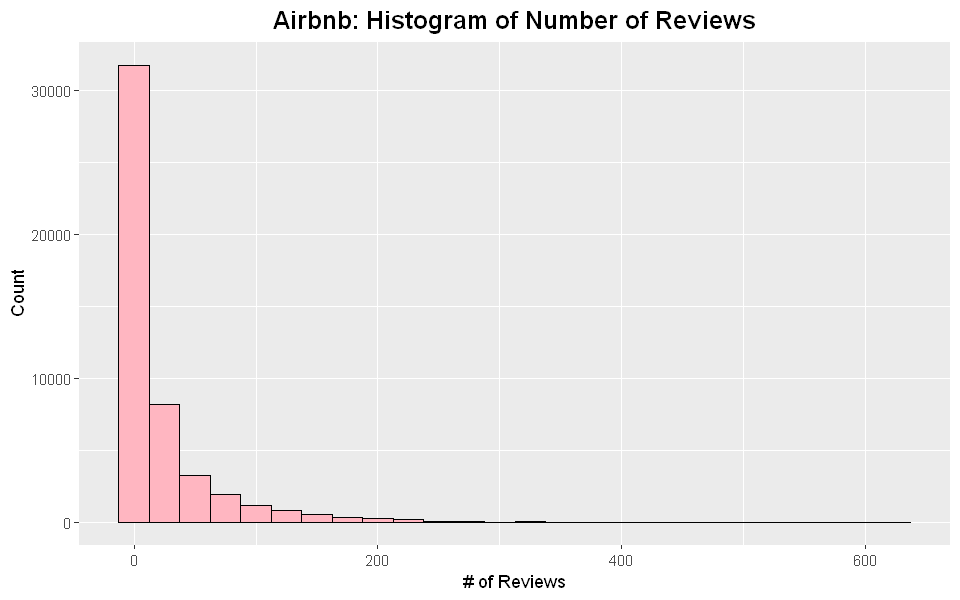

In [22]:
ggplot(data, aes(x=number_of_reviews)) + geom_histogram(binwidth = 25, color="black", fill="lightpink") + 
  labs(x = "# of Reviews", y = "Count", title = "Airbnb: Histogram of Number of Reviews") +
  theme(plot.title = element_text(face = "bold", size = (15), hjust = 0.5))

Recall that the median number of reviews is 5, which is confirmed in the histogram. There appear to be some listings with a high number of reviews, some of which are the maximum 629. These listings with many reviews make the distribution skewed to the right.

#### We can plot `'number_of_reviews'` versus the other attributes to help make any trends apparent:

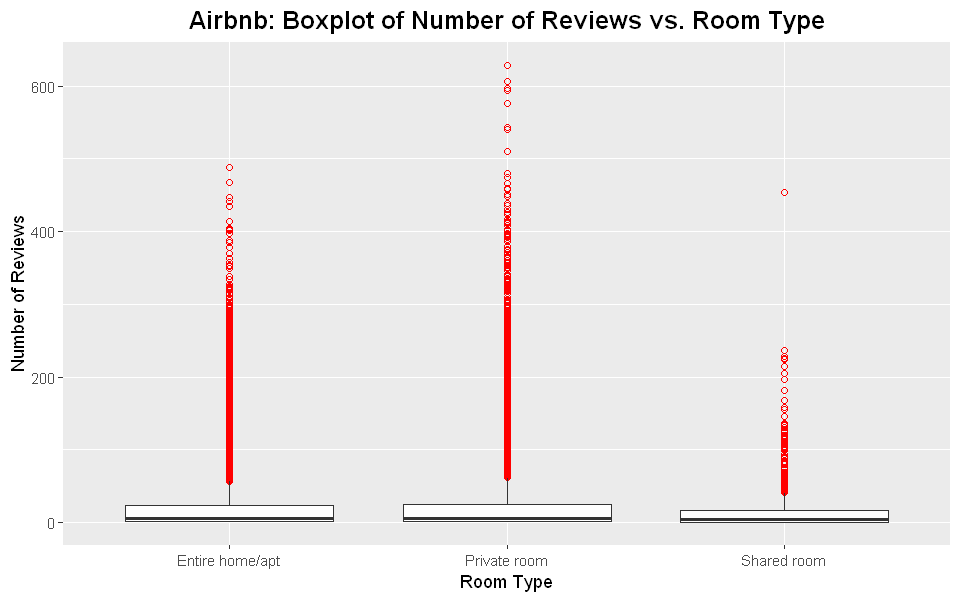

In [23]:
ggplot(data, aes(x=room_type, y=number_of_reviews)) + geom_boxplot(outlier.colour = "red", outlier.shape = 1) +
  labs(x = "Room Type", y = "Number of Reviews", title = "Airbnb: Boxplot of Number of Reviews vs. Room Type") +
  theme(plot.title = element_text(face = "bold", size = (15), hjust = 0.5))

- There appear to be **more reviews for the room type 'Private room'**, followed by 'Entire home/apt' then 'Shared room'.  

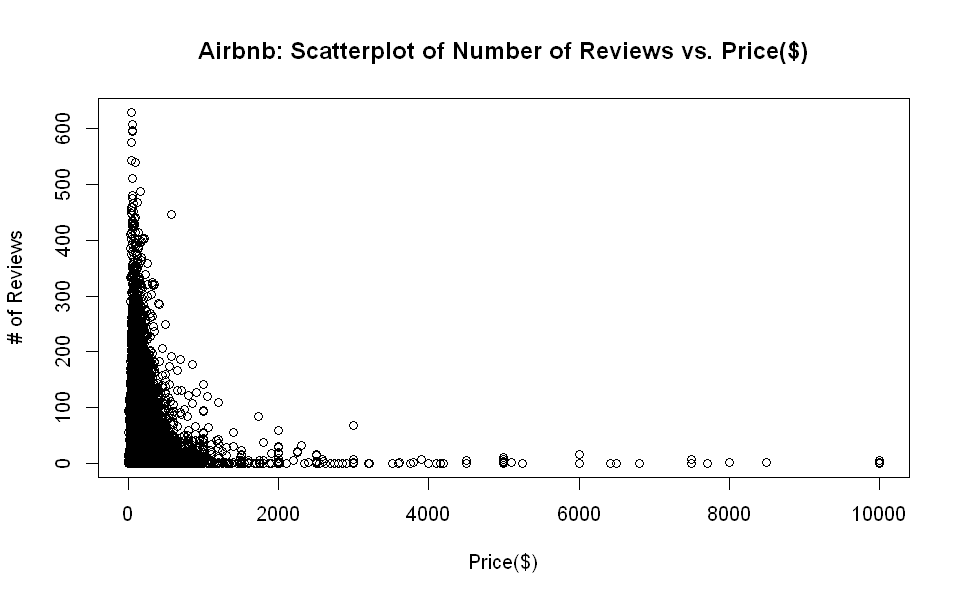

In [24]:
plot(data$price, data$number_of_reviews, xlab="Price($)", ylab="# of Reviews",
     main="Airbnb: Scatterplot of Number of Reviews vs. Price($)")

- We have already seen this plot, but this time we are focused on how price affects the the number of reviews. Listings with a **lower price tend to have a higher number of reviews**.

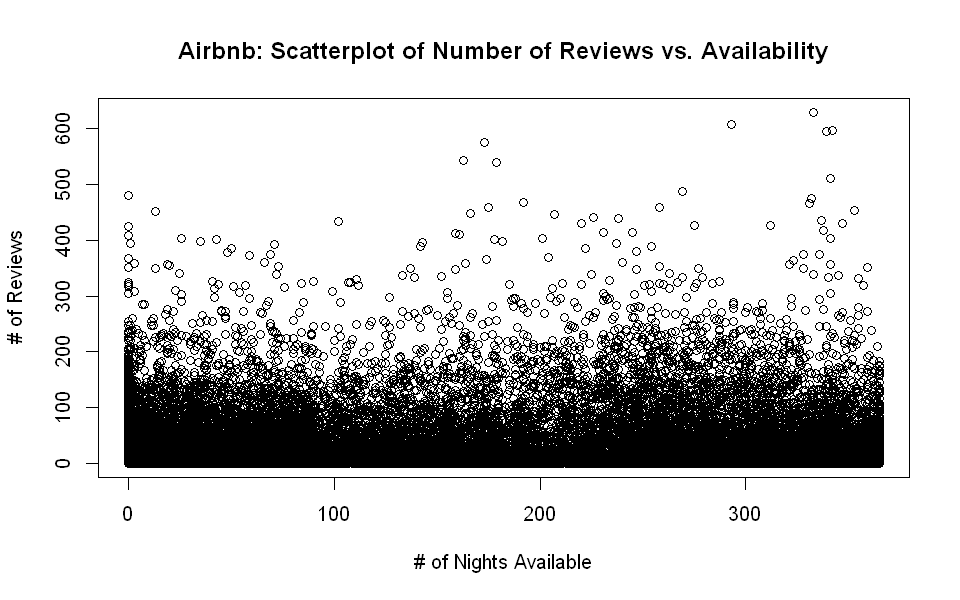

In [25]:
plot(data$availability_365, data$number_of_reviews, xlab="# of Nights Available", ylab="# of Reviews",
     main="Airbnb: Scatterplot of Number of Reviews vs. Availability")

- It appears that no matter what the listing availability is, there are many listings with 0 - 100 reviews. However, upon closer inspection there seems to be a **slightly increasing number of reviews as the number of nights available increases**.

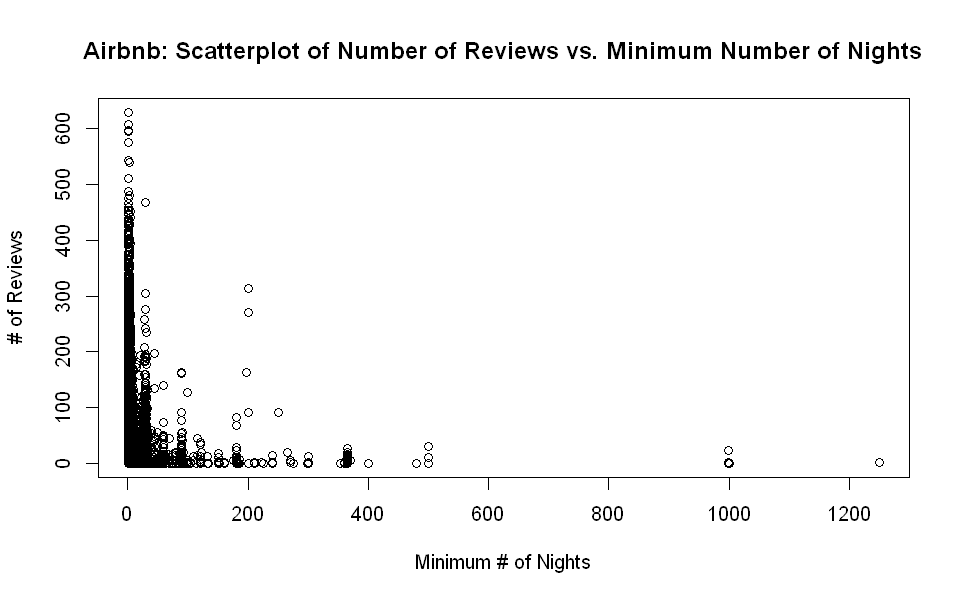

In [26]:
plot(data$minimum_nights, data$number_of_reviews, xlab="Minimum # of Nights", ylab="# of Reviews",
     main="Airbnb: Scatterplot of Number of Reviews vs. Minimum Number of Nights")

- Listings that require a **lower minimum number of nights tend to have significantly more reviews** than those that require a more long-term stay. Some exceptions appear to have a 200 day (~6 month) minimum number of nights.

___

### Task 3) Listing Title Analysis


Our final goal is to determine the most commonly used words in listing titles:

#### Let's make a simple word cloud to see the most commonly used words:

Warning message in tm_map.SimpleCorpus(docs, content_transformer(tolower)):
"transformation drops documents"Warning message in tm_map.SimpleCorpus(docs, removeWords, stopwords("english")):
"transformation drops documents"Warning message in tm_map.SimpleCorpus(docs, removeWords, c("room", "bedroom", "apartment", :
"transformation drops documents"Warning message in tm_map.SimpleCorpus(docs, removePunctuation):
"transformation drops documents"

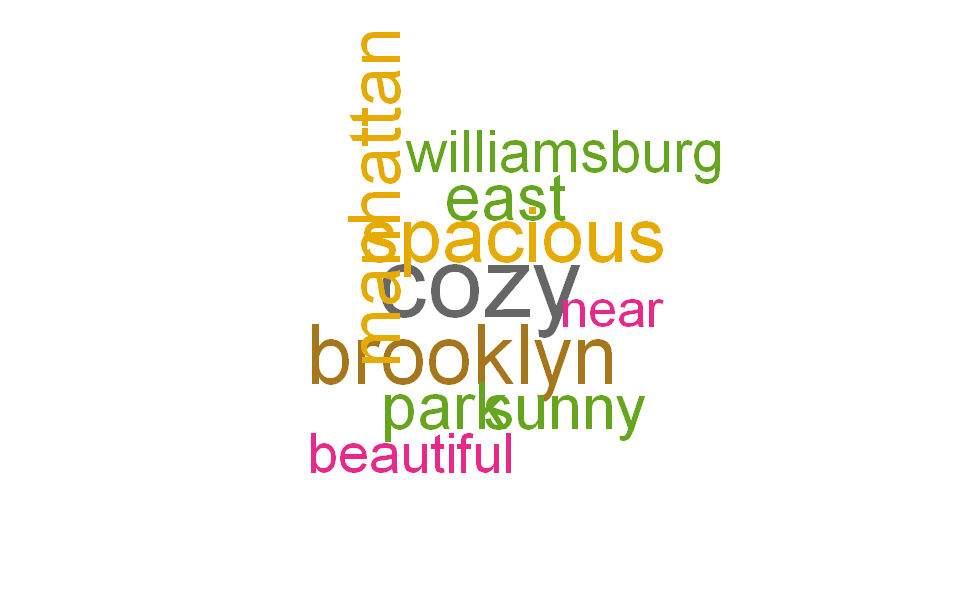

In [27]:
data$name <-as.character(data$name)
Encoding(data$name) <- 'UTF-8'

text <- as.vector(data['name'])

docs <- Corpus(VectorSource(text))

## Text cleaning
# Convert text to lower case
docs <- tm_map(docs, content_transformer(tolower))

# Remove english common stopwords
docs <- tm_map(docs, removeWords, stopwords("english"))

# Remove specific stopwords 
docs <- tm_map(docs, removeWords, c("room", "bedroom", "apartment", "private", "apt", "studio")) 

# Remove punctuations
docs <- tm_map(docs, removePunctuation)

dtm <- TermDocumentMatrix(docs)
m <- as.matrix(dtm)
v <- sort(rowSums(m),decreasing=TRUE)
d <- data.frame(word = names(v),freq=v)

set.seed(1234)
wordcloud(words = d$word, freq = d$freq, scale=c(5, 0.5),
          min.freq = 1, max.words=10, 
          random.order=FALSE, rot.per=0.35,
          colors=brewer.pal(8, "Dark2"),
          use.r.layout=FALSE
          )

In [28]:
# Table of top ten most frequent words
d[1:20,]

,word,freq
cozy,cozy,4988
brooklyn,brooklyn,4052
spacious,spacious,3722
manhattan,manhattan,3434
park,park,3043
east,east,3017
sunny,sunny,2880
williamsburg,williamsburg,2634
beautiful,beautiful,2478
near,near,2324


- We see that the most common words include adjectives such as *cozy, sunny, bright, luxery, modern, beautiful*, as well as some of the most frequent neighbourhoods (Williamsburg, East Park) and neighbourhood groups (Brooklyn, Manhattan). Another important word is *near*.

___

## Conclusion



This concludes our project. We have built many useful visuals that make trends more apparent using the 10 selected listing attributes. We should keep in mind that the insights from this project should only be applied to Airbnb hosts and guests in New York City. Also, the prices and insights are likely to not be relevant during the Coronavirus pandemic.

**For hosts**

Although a host could base their listing price on either the `'neighbourhood_group'` or the `'room_type'`, it woulbe likely be more profitable if they based the listing price on both factors. Or if their listing is in one of the top three most frequent `'neighbourhood'`, they may be able to adjust their price even higher, based on all three factors. 

Overall, it appears that *listings that have the highest price*:

- are in Manhattan
- are an Entire home/apt
- have a small minimum number of nights requirement
- are available more nights of the year
- tend to be near New York City tourist destinations

If a host should choose to want to *increase their number of reviews*, they should:

- list a private room
- have a price lower than \\$1,000, 
- have more nights available throughout the year
- have a smaller minimum number of nights requirement 

Hosts should take note that although most listings with the highest price have a small minimum number of nights requirement, there are also many listings with low prices that have this same low attribute value. Hosts should also be aware that some of the most commonly used words in listing titles include adjective such as *cozy, spacious, beautiful*, as well as other words like *'near'*. More analyses could be performed on the listing name to determine which words are associated with the highest priced and/or listings with the most reviews.

**For guests**

Overall, it appears that *listings that have the lowest price*:

- are in the Bronx or Staten Island
- are a shared room or private room
- have a small minimum number of nights requirement
- have more reviews

Guests should be aware that listings near tourist attractions tend to be higher in price. Also, there appear to not be many shared room listings in Staten Island, as of this data collection. Guests should also take note that although most listings with the lowest price have a small minimum number of nights requirement, there are also some listings with high prices that have this same low attribute value.